# 1. **Necessary Libraries**

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score
## for data
import pandas as pd

import re
import nltk## for language detection



#**2. Reading the dataset with pandas, dropping null values (calculated earlier at less than 5%) and creating a copy of the dataframe for the modelling process**

In [ ]:
df = pd.read_csv('justice.csv.zip', delimiter=',', encoding = "utf8")
df.head()

,Unnamed: 0,ID,name,href,docket,term,first_party,second_party,facts,facts_len,majority_vote,minority_vote,first_party_winner,decision_type,disposition,issue_area
0,0,50606,Roe v. Wade,https://api.oyez.org/cases/1971/70-18,70-18,1971,Jane Roe,Henry Wade,"<p>In 1970, Jane Roe (a fictional name used in...",501,7,2,True,majority opinion,reversed,NaN
1,1,50613,Stanley v. Illinois,https://api.oyez.org/cases/1971/70-5014,70-5014,1971,"Peter Stanley, Sr.",Illinois,<p>Joan Stanley had three children with Peter ...,757,5,2,True,majority opinion,reversed/remanded,Civil Rights
2,2,50623,Giglio v. United States,https://api.oyez.org/cases/1971/70-29,70-29,1971,John Giglio,United States,<p>John Giglio was convicted of passing forged...,495,7,0,True,majority opinion,reversed/remanded,Due Process
3,3,50632,Reed v. Reed,https://api.oyez.org/cases/1971/70-4,70-4,1971,Sally Reed,Cecil Reed,"<p>The Idaho Probate Code specified that ""male...",378,7,0,True,majority opinion,reversed/remanded,Civil Rights
4,4,50643,Miller v. California,https://api.oyez.org/cases/1971/70-73,70-73,1971,Marvin Miller,California,"<p>Miller, after conducting a mass mailing cam...",305,5,4,True,majority opinion,vacated/remanded,First Amendment


#**Pandas Profiling**

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(df, title="Supreme Court Cases", html={"style":{"full_width":True}})

In [ ]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#**Sweetviz**

In [ ]:
!pip install sweetviz


In [ ]:
import sweetviz as sz
comparison_report=sz.analyze(df)

                                             |          | [  0%]   00:00 -> (? left)


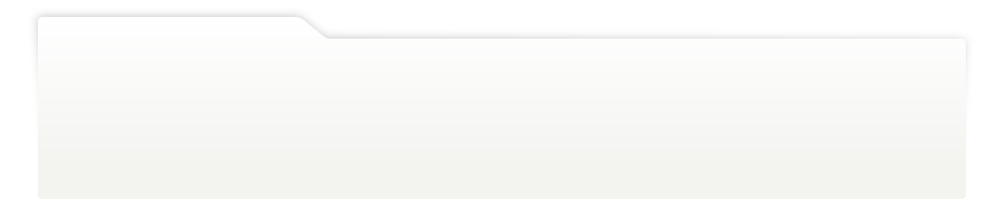
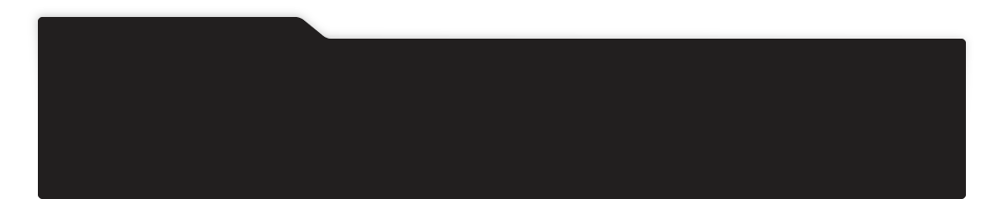
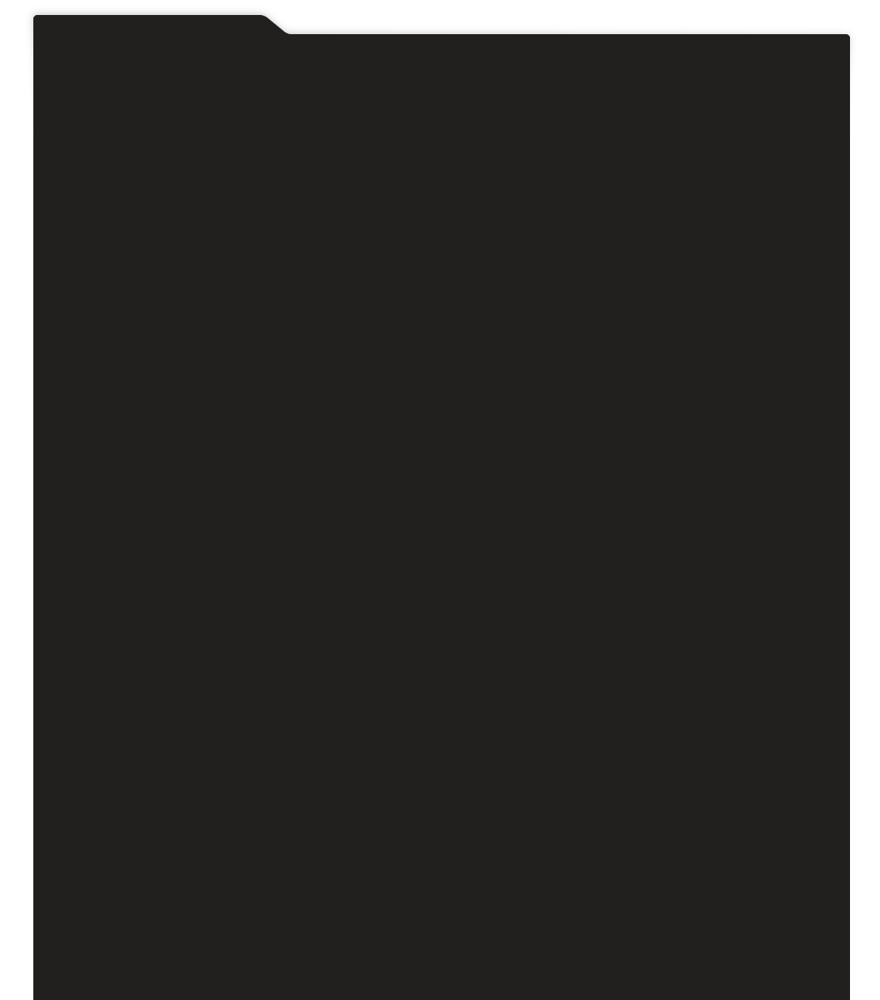
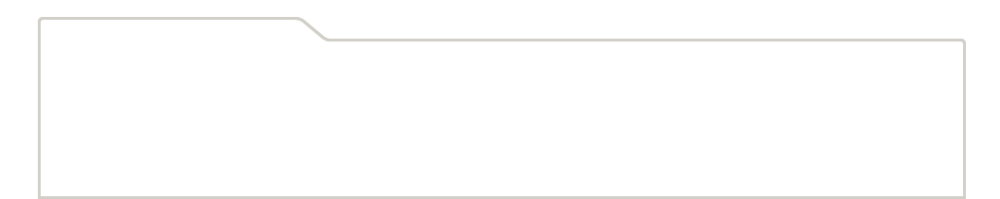
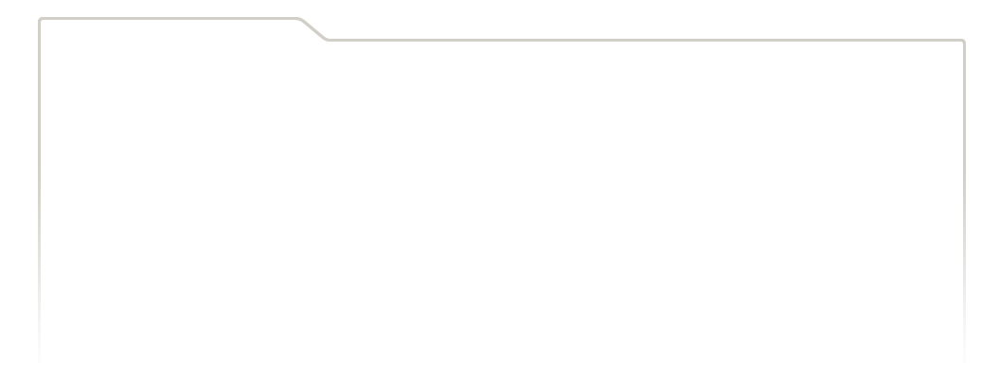
...
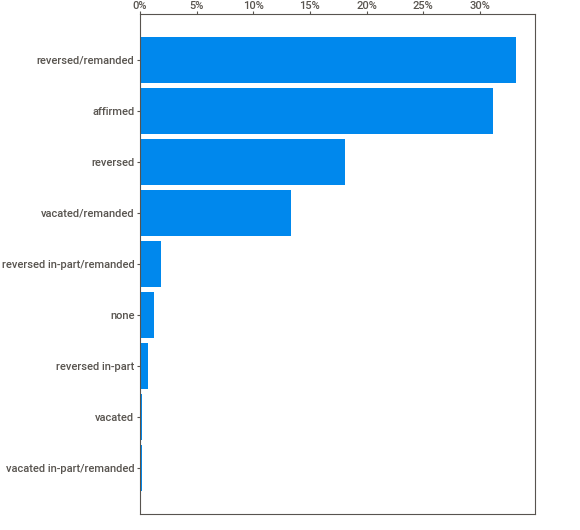
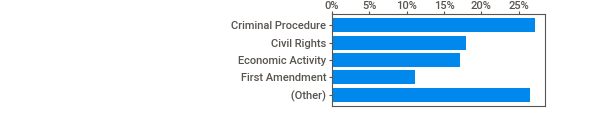
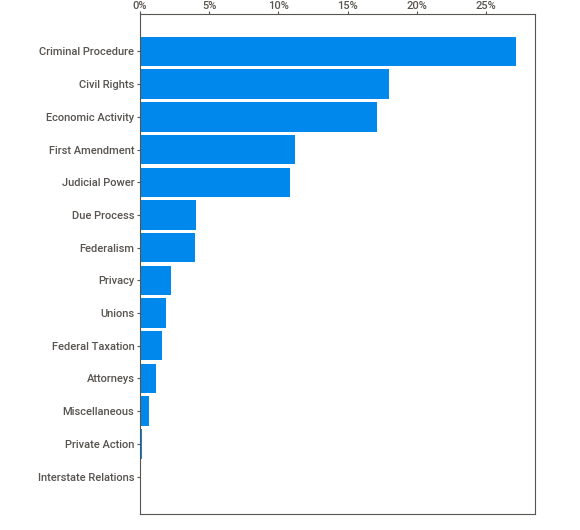
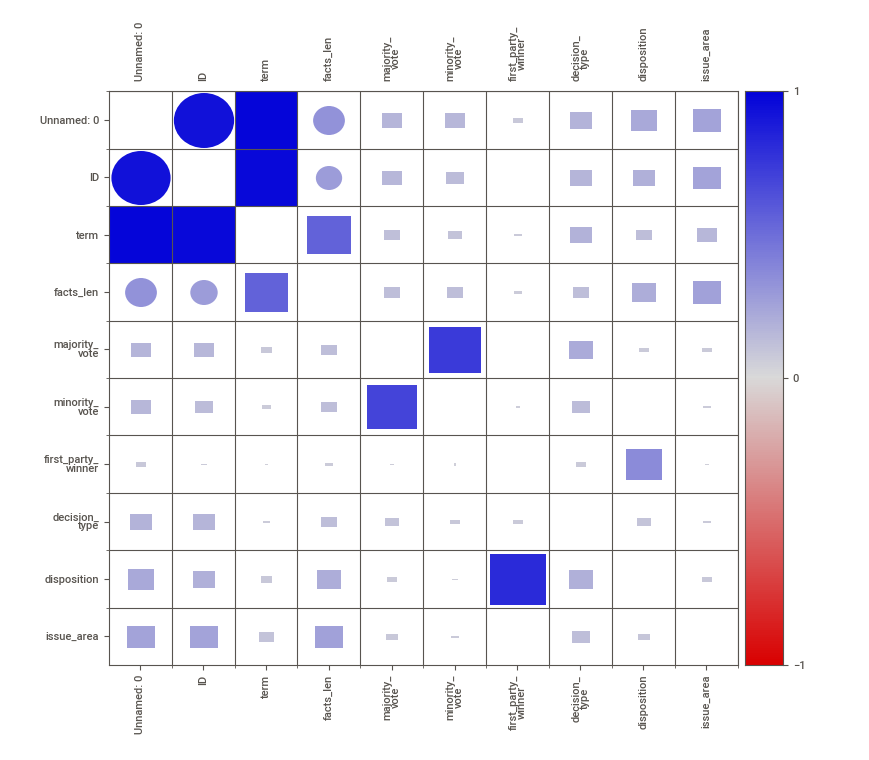
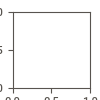

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
comparison_report.show_notebook()
comparison_report.show_notebook(w=1500, h=300, scale=0.8)
comparison_report.show_html(scale=0.9)

In [ ]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,3303.00,1651.00,953.64,0.00,825.50,1651.00,2476.50,3302.00
ID,3303.00,56336.51,3600.26,50606.00,54339.50,55260.00,59437.50,63335.00
facts_len,3303.00,1112.50,531.51,26.00,757.00,1049.00,1381.00,6201.00
majority_vote,3303.00,7.01,1.73,0.00,5.00,7.00,9.00,9.00
minority_vote,3303.00,1.73,1.60,0.00,0.00,2.00,3.00,4.00


#**Null Check**

In [ ]:
df.isnull().sum()

Unnamed: 0              0
ID                      0
name                    0
href                    0
docket                  0
term                    0
first_party             1
second_party            1
facts                   0
facts_len               0
majority_vote           0
minority_vote           0
first_party_winner     15
decision_type           7
disposition            72
issue_area            142
dtype: int64

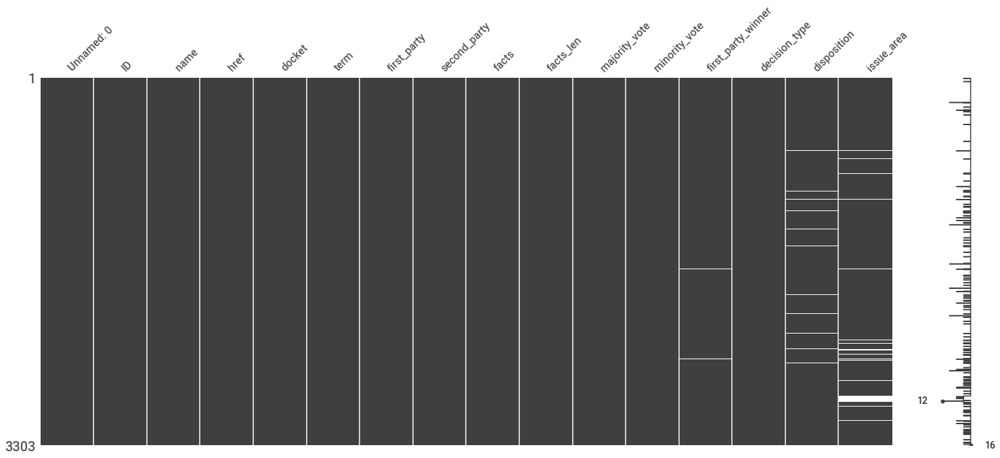

In [ ]:
import missingno as msno
%matplotlib inline
msno.matrix(df)

#**Analysing Text**

In [ ]:
df.head(2).style.background_gradient(cmap='YlGn')

,Unnamed: 0,ID,name,href,docket,term,first_party,second_party,facts,facts_len,majority_vote,minority_vote,first_party_winner,decision_type,disposition,issue_area
0,0,50606,Roe v. Wade,https://api.oyez.org/cases/1971/70-18,70-18,1971,Jane Roe,Henry Wade,"In 1970, Jane Roe (a fictional name used in court documents to protect the plaintiff’s identity) filed a lawsuit against Henry Wade, the district attorney of Dallas County, Texas, where she resided, challenging a Texas law making abortion illegal except by a doctor’s orders to save a woman’s life. In her lawsuit, Roe alleged that the state laws were unconstitutionally vague and abridged her right of personal privacy, protected by the First, Fourth, Fifth, Ninth, and Fourteenth Amendments.",501,7,2,True,majority opinion,reversed,nan
1,1,50613,Stanley v. Illinois,https://api.oyez.org/cases/1971/70-5014,70-5014,1971,"Peter Stanley, Sr.",Illinois,"Joan Stanley had three children with Peter Stanley. The Stanleys never married, but lived together off and on for 18 years. When Joan died, the State of Illinois took the children. Under Illinois law, unwed fathers were presumed unfit parents regardless of their actual fitness and their children became wards of the state. Peter appealed the decision, arguing that the Illinois law violated the Equal Protection Clause of the Fourteenth Amendment because unwed mothers were not deprived of their children without a showing that they were actually unfit parents. The Illinois Supreme Court rejected Stanley’s Equal Protection claim, holding that his actual fitness as a parent was irrelevant because he and the children’s mother were unmarried.",757,5,2,True,majority opinion,reversed/remanded,Civil Rights


#**Word Cloud**

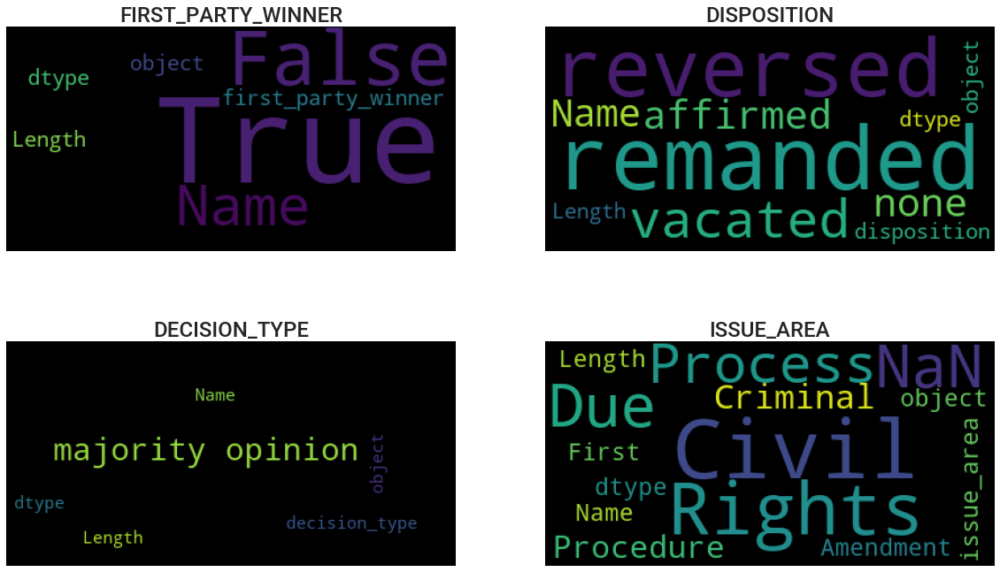

In [ ]:
text_cols = ['first_party_winner', 'disposition', 'decision_type', 'issue_area']

from wordcloud import WordCloud, STOPWORDS

wc = WordCloud(stopwords = set(list(STOPWORDS) + ['|']), random_state = 42)
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
axes = [ax for axes_row in axes for ax in axes_row]

for i, c in enumerate(text_cols):
  op = wc.generate(str(df[c]))
  _ = axes[i].imshow(op)
  _ = axes[i].set_title(c.upper(), fontsize=24)
  _ = axes[i].axis('off')

#**Strip Plot**

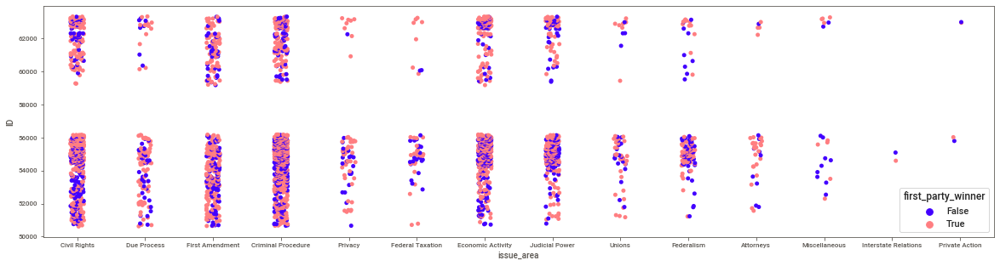

In [ ]:
plt.figure(figsize=(20,5))
sns.stripplot(y="ID", x="issue_area", hue="first_party_winner", data=df, palette="gnuplot2");
plt.show()

#**Count Plot**


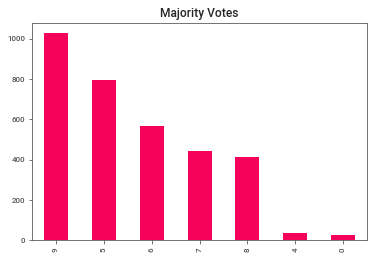

In [ ]:
df["majority_vote"].value_counts().plot.bar(color='#f5005a', title='Majority Votes');


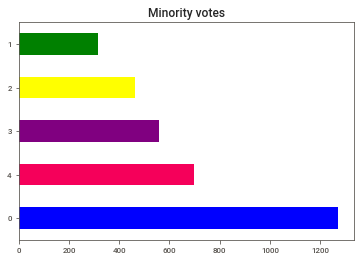

In [ ]:
df["minority_vote"].value_counts().plot.barh(color=['blue', '#f5005a', 'purple', 'yellow', 'green'], title='Minority votes');

#**Pair plot**

<Figure size 720x720 with 0 Axes>

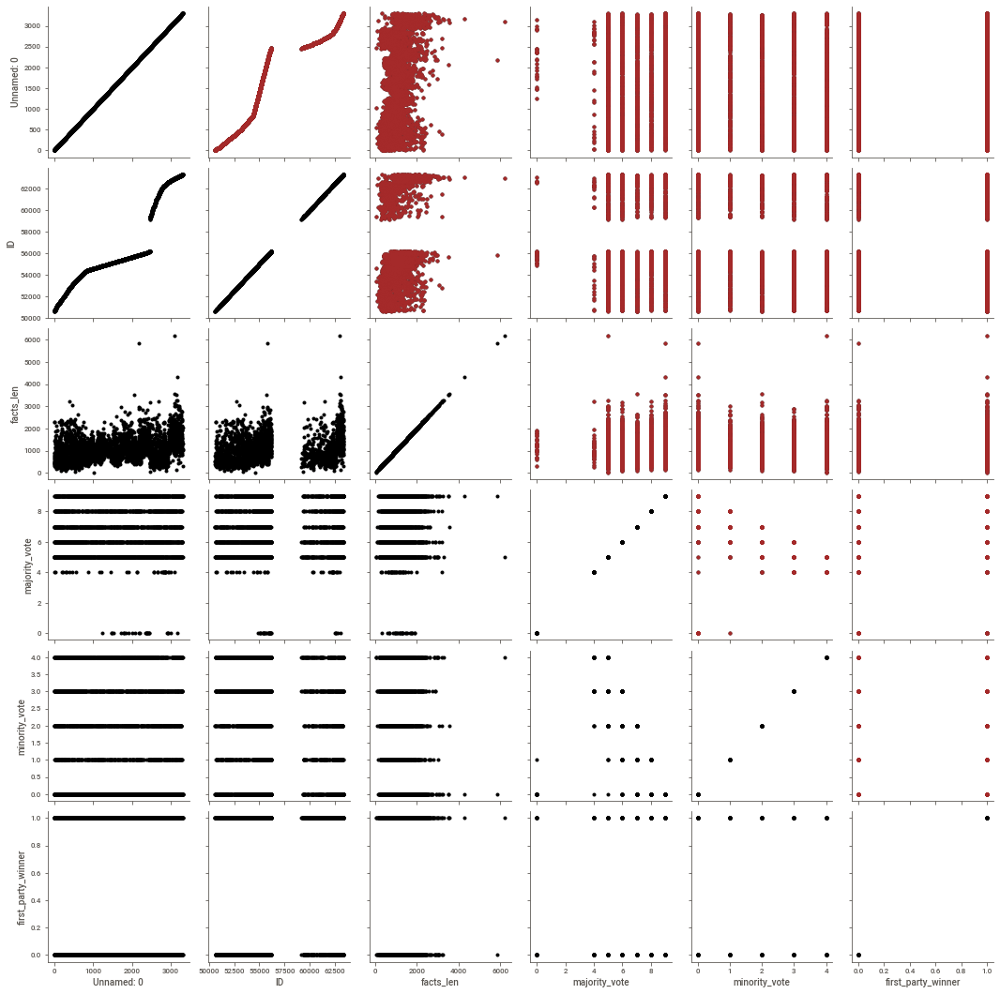

In [ ]:
plt.figure(figsize=(10,10))
df1=sns.PairGrid(df)
df1.map(plt.scatter,color='black')
df1.map_upper(plt.scatter,color='brown')
plt.show()

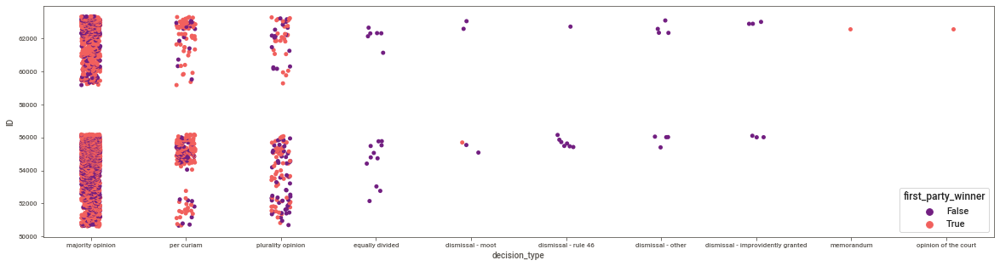

In [ ]:
plt.figure(figsize=(20,5))
sns.stripplot(y="ID", x="decision_type", hue="first_party_winner", data=df, palette="magma");
plt.show()

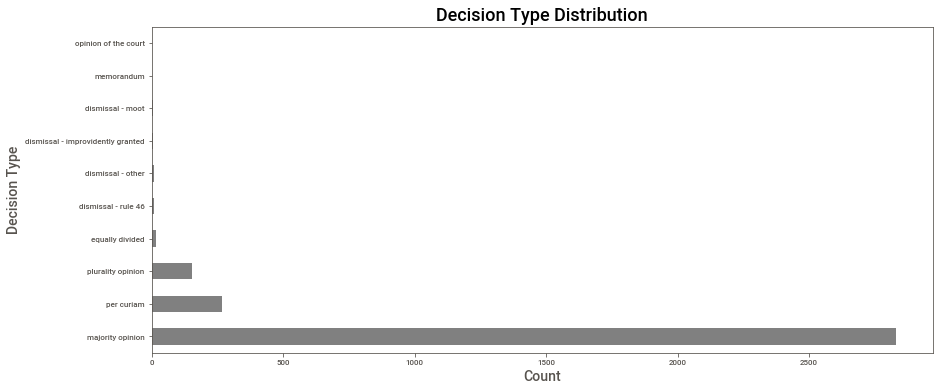

In [ ]:
ax = df['decision_type'].value_counts().plot.barh(figsize=(14, 6), color='grey')
ax.set_title('Decision Type Distribution',color='black', size=18)
ax.set_ylabel('Decision Type', size=14)
ax.set_xlabel('Count', size=14);

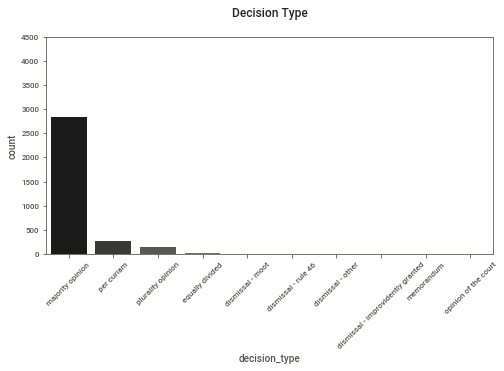

In [ ]:
plt.figure(figsize = (8, 4))
ax = sns.countplot(data = df,
                   x = 'decision_type',
                   palette = 'Greys_r')
ax.set_ylim(0, 4500)
ax.set_title('Decision Type', pad = 20)
plt.xticks(rotation=45)

plt.show()

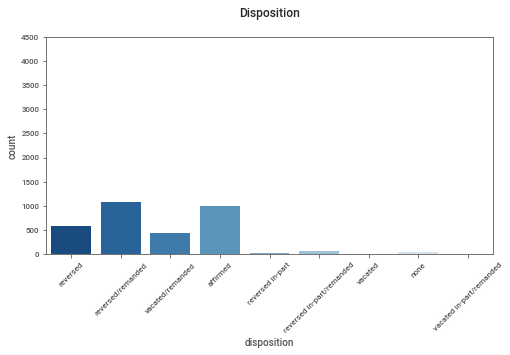

In [ ]:
plt.figure(figsize = (8, 4))
ax = sns.countplot(data = df,
                   x = 'disposition',
                   palette = 'Blues_r')
ax.set_ylim(0, 4500)
ax.set_title('Disposition', pad = 20)
plt.xticks(rotation=45)

plt.show()

#**Statistical Analysis**

In [ ]:
df.describe()

,Unnamed: 0,ID,facts_len,majority_vote,minority_vote
count,3303.000000,3303.000000,3303.000000,3303.000000,3303.000000
mean,1651.000000,56336.505298,1112.496821,7.009688,1.727823
std,953.638296,3600.259018,531.514960,1.726244,1.604460
min,0.000000,50606.000000,26.000000,0.000000,0.000000
25%,825.500000,54339.500000,757.000000,5.000000,0.000000
50%,1651.000000,55260.000000,1049.000000,7.000000,2.000000
75%,2476.500000,59437.500000,1381.000000,9.000000,3.000000
max,3302.000000,63335.000000,6201.000000,9.000000,4.000000


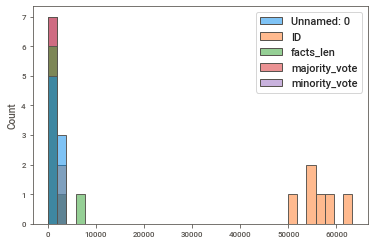

In [ ]:
sns.histplot(df.describe());

#**Kde plot**

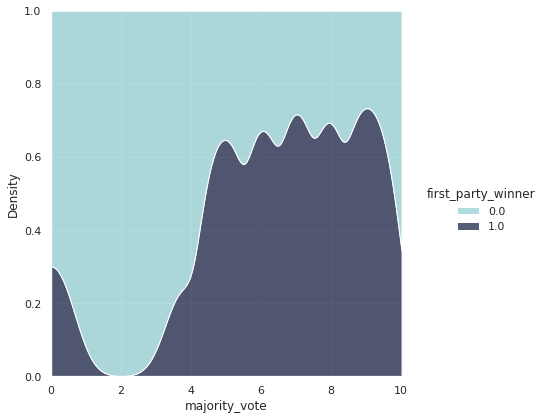

In [ ]:
import seaborn as sns
sns.set_theme(style="darkgrid")
sns.displot(
    data=df,
    x="majority_vote", hue="first_party_winner",
    kind="kde", height=6,
    multiple="fill", clip=(0, None),
    palette="ch:rot=-.25,hue=1,light=.75",
)

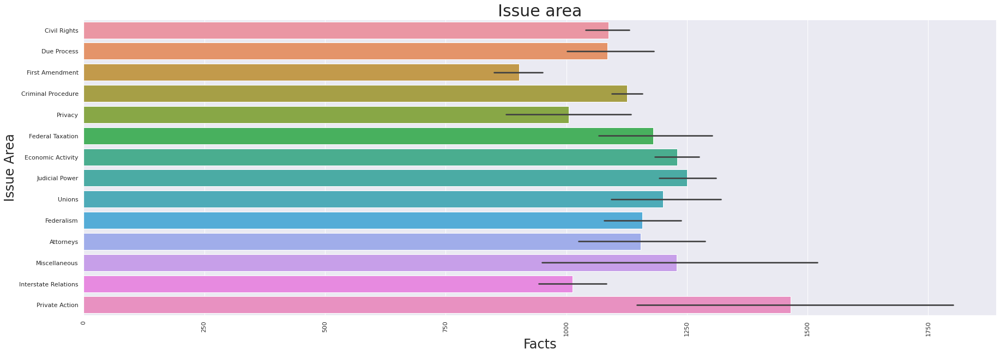

In [ ]:
fig_dims = (30, 10)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data = df, x = "facts_len", y = "issue_area", ax=ax)

plt.xlabel("Facts", fontsize=24)
plt.ylabel("Issue Area", fontsize=24)

plt.title('Issue area', fontsize=30)
plt.xticks(rotation = 90);

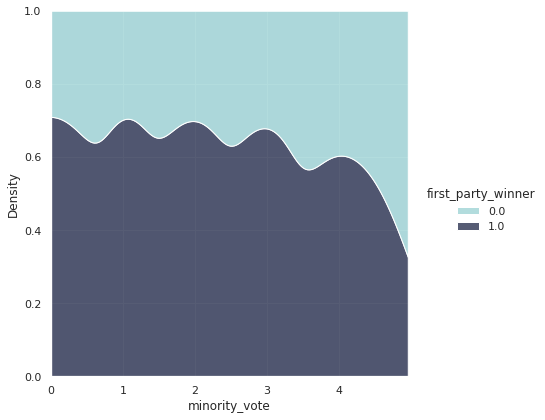

In [ ]:
sns.set_theme(style="darkgrid")
sns.displot(
    data=df,
    x="minority_vote", hue="first_party_winner",
    kind="kde", height=6,
    multiple="fill", clip=(0, None),
    palette="ch:rot=-.25,hue=1,light=.75",
)

#**Pie Chart**

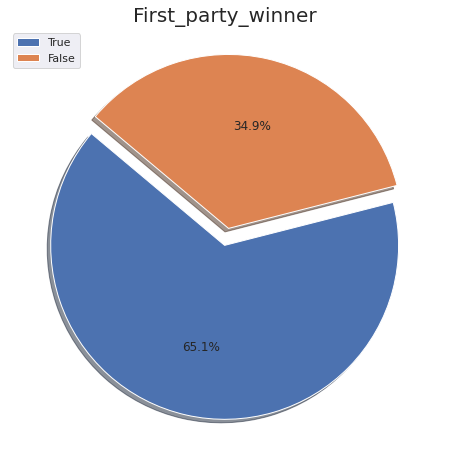

In [ ]:
plt.figure(figsize=(8, 8))

explode = [0,0.1]
plt.pie(df['first_party_winner'].value_counts(), explode=explode, autopct='%1.1f%%', shadow=True, startangle=140)
plt.legend(labels=['True','False'])
plt.title('First_party_winner', fontsize=20)
plt.axis('off');

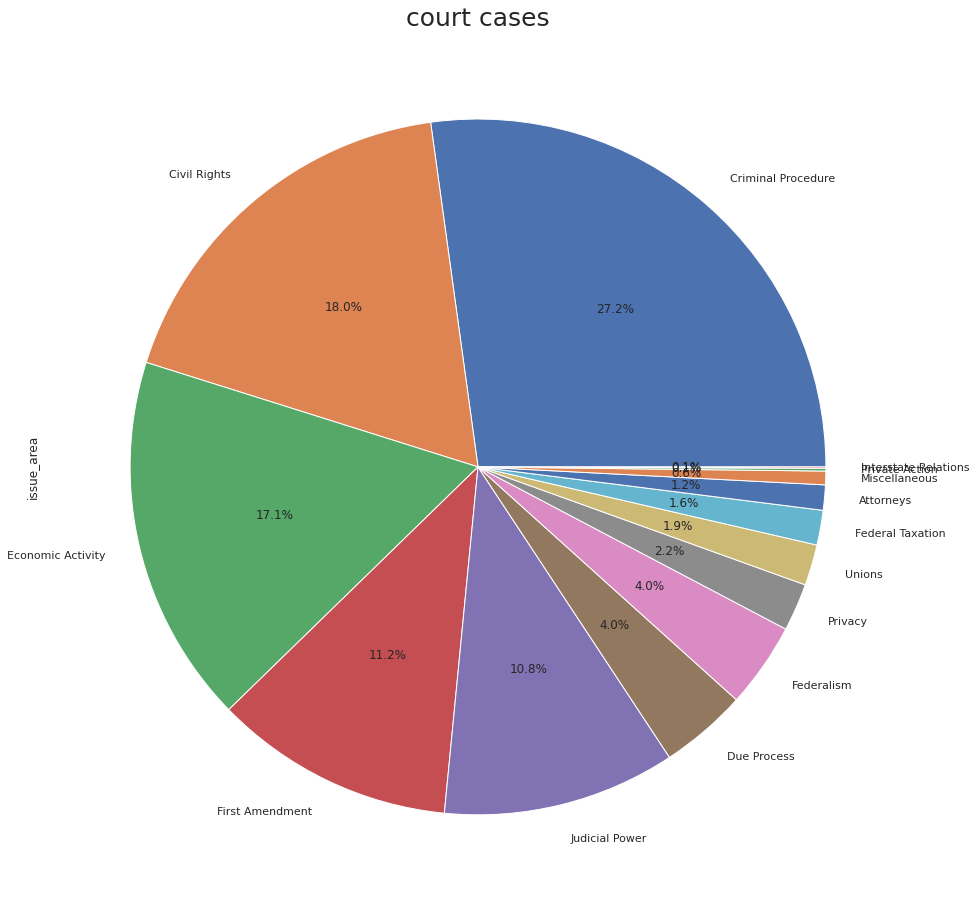

In [ ]:
plt.title('court cases', fontsize=25)
df["issue_area"].value_counts().plot(kind="pie", autopct='%1.1f%%', figsize=(16, 16));

In [ ]:
categorical_nan = [feature for feature in df.columns if df[feature].isna().sum()>0 and df[feature].dtypes=='O']
print(categorical_nan)

['first_party', 'second_party', 'first_party_winner', 'decision_type', 'disposition', 'issue_area']


In [ ]:
for feature in categorical_nan:
    df[feature] = df[feature].fillna('None')

#**Checking null After Handling It**

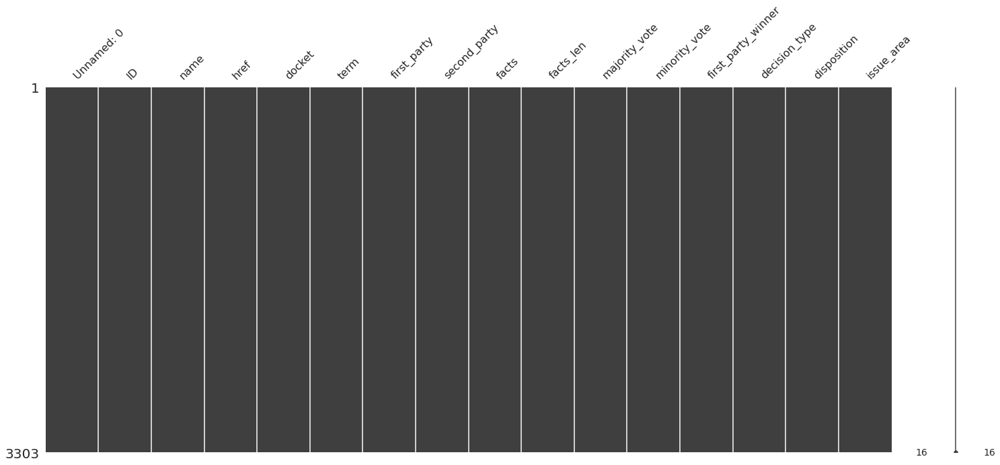

In [ ]:
import missingno as msno
%matplotlib inline
msno.matrix(df)

In [ ]:
df = pd.read_csv('justice.csv.zip', delimiter=',', encoding = "utf8")
df.dropna(inplace=True)

In [ ]:
fig = px.bar(df[['issue_area','decision_type','first_party_winner']].sort_values('decision_type', ascending=False), 
                        y = "decision_type", x= "issue_area", color='first_party_winner', template='ggplot2')
fig.update_xaxes(tickangle=90, tickfont=dict(family='Rockwell', color='darkblue', size=15))
fig.update_layout(title_text="Issue Areas Decisions")

fig.show()

In [ ]:
import plotly.express as px
df = df
fig = px.scatter(df, x="decision_type", y="name", color="first_party_winner",
                 title="first_party_winner")
fig.show()

In [ ]:
df1 = df.copy()

In [ ]:
df1.drop(columns=['Unnamed: 0', 'docket','name','first_party','second_party', 'issue_area', 
                 'facts_len', 'majority_vote', 'minority_vote', 'href', 'ID','term'], inplace=True)

# 3. Seperating the dataset into target variables and two groups of independent variables, one (df_cat) which requires one-hot encoding to be machine readable and the other (df_nlp) which is text data which needs to be cleaned for features to be engineered from it.

In [ ]:
df_cat = df1[['decision_type', 'disposition']]

In [ ]:
df_target = df1['first_party_winner']

In [ ]:
df_nlp = df1['facts']

# 4. Resetting indices to avoid NaNs during concatenation and performing one-hot encoding

In [ ]:
df_cat.reset_index(drop=True, inplace=True)
df_target.reset_index(drop=True, inplace=True)
df_nlp.reset_index(drop=True, inplace=True)

In [ ]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
df_target= label_encoder.fit_transform(df_target)

In [ ]:
df_target1 = pd.DataFrame(df_target, columns=['first_party_winner'])
df_target1

,first_party_winner
0,1
1,1
2,1
3,1
4,1
...,...
3093,1
3094,1
3095,0
3096,1


In [ ]:
frames = [df_cat, df_target1]
df_concat = pd.concat(frames, axis=1, join='inner')
df_concat

,decision_type,disposition,first_party_winner
0,majority opinion,reversed/remanded,1
1,majority opinion,reversed/remanded,1
2,majority opinion,reversed/remanded,1
3,majority opinion,vacated/remanded,1
4,majority opinion,reversed,1
...,...,...,...
3093,majority opinion,reversed/remanded,1
3094,majority opinion,reversed/remanded,1
3095,majority opinion,affirmed,0
3096,majority opinion,vacated/remanded,1


In [ ]:
df_nlp1 = pd.DataFrame(df_nlp, columns=['facts'])

In [ ]:
df_nlp1['facts'] = df_nlp1['facts'].str.replace(r'<[^<>]*>', '', regex=True)
df_nlp1

,facts
0,Joan Stanley had three children with Peter Sta...
1,John Giglio was convicted of passing forged mo...
2,"The Idaho Probate Code specified that ""males m..."
3,"Miller, after conducting a mass mailing campai..."
4,Ernest E. Mandel was a Belgian professional jo...
...,...
3093,For over a century after the Alaska Purchase i...
3094,"Refugio Palomar-Santiago, a Mexican national, ..."
3095,Tarahrick Terry pleaded guilty to one count of...
3096,Joshua James Cooley was parked in his pickup t...


# 5. Performing initial cleaning and tokenizing the corpus, introducing a function to perform further cleaning and Lemmatization upon the data.

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
corpus = df_nlp1["facts"]
lst_tokens = nltk.tokenize.word_tokenize(corpus.str.cat(sep=" "))

In [ ]:
ps = nltk.stem.porter.PorterStemmer()
lem = nltk.stem.wordnet.WordNetLemmatizer()

In [ ]:

def utils_preprocess_text(text, flg_stemm=False, flg_lemm=True, lst_stopwords=None):
    ## clean (convert to lowercase and remove punctuations and characters and then strip)
    text = re.sub(r'[^\w\s]', '', str(text).lower().strip())
            
    ## Tokenize (convert from string to list)
    lst_text = text.split()    ## remove Stopwords
    if lst_stopwords is not None:
        lst_text = [word for word in lst_text if word not in 
                    lst_stopwords]
                
    ## Stemming (remove -ing, -ly, ...)
    if flg_stemm == True:
        ps = nltk.stem.porter.PorterStemmer()
        lst_text = [ps.stem(word) for word in lst_text]
                
    ## Lemmatisation (convert the word into root word)
    if flg_lemm == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()
        lst_text = [lem.lemmatize(word) for word in lst_text]
            
    ## back to string from list
    text = " ".join(lst_text)
    return text

In [ ]:
import nltk
nltk.download('wordnet')
  

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
#Lowercase
df_nlp1["facts_clean"] = df_nlp1["facts"].apply(lambda x: utils_preprocess_text(x, flg_stemm=False, flg_lemm=True))

In [ ]:
df_nlp1

,facts,facts_clean
0,Joan Stanley had three children with Peter Sta...,joan stanley had three child with peter stanle...
1,John Giglio was convicted of passing forged mo...,john giglio wa convicted of passing forged mon...
2,"The Idaho Probate Code specified that ""males m...",the idaho probate code specified that male mus...
3,"Miller, after conducting a mass mailing campai...",miller after conducting a mass mailing campaig...
4,Ernest E. Mandel was a Belgian professional jo...,ernest e mandel wa a belgian professional jour...
...,...,...
3093,For over a century after the Alaska Purchase i...,for over a century after the alaska purchase i...
3094,"Refugio Palomar-Santiago, a Mexican national, ...",refugio palomarsantiago a mexican national wa ...
3095,Tarahrick Terry pleaded guilty to one count of...,tarahrick terry pleaded guilty to one count of...
3096,Joshua James Cooley was parked in his pickup t...,joshua james cooley wa parked in his pickup tr...


# 6. Introducing Count Vectorizer to derive features from textual data.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
vectorizer = CountVectorizer()
x = vectorizer.fit_transform(df_nlp1['facts_clean'])

In [ ]:
x1 = x.toarray()

In [ ]:
df.reset_index(drop=True, inplace=True)

In [ ]:
df_nlp2 = pd.concat([df_nlp1,df_target1['first_party_winner']],axis=1, join='inner')
df_nlp2

,facts,facts_clean,first_party_winner
0,Joan Stanley had three children with Peter Sta...,joan stanley had three child with peter stanle...,1
1,John Giglio was convicted of passing forged mo...,john giglio wa convicted of passing forged mon...,1
2,"The Idaho Probate Code specified that ""males m...",the idaho probate code specified that male mus...,1
3,"Miller, after conducting a mass mailing campai...",miller after conducting a mass mailing campaig...,1
4,Ernest E. Mandel was a Belgian professional jo...,ernest e mandel wa a belgian professional jour...,1
...,...,...,...
3093,For over a century after the Alaska Purchase i...,for over a century after the alaska purchase i...,1
3094,"Refugio Palomar-Santiago, a Mexican national, ...",refugio palomarsantiago a mexican national wa ...,1
3095,Tarahrick Terry pleaded guilty to one count of...,tarahrick terry pleaded guilty to one count of...,0
3096,Joshua James Cooley was parked in his pickup t...,joshua james cooley wa parked in his pickup tr...,1


In [ ]:
xfeatures = df_nlp2['facts_clean']
ylabel = df_nlp2['first_party_winner']

# 7. Using sklearn train_test_split and Pipeline to fit and score the model on Logistic Regression and K-NearestNeighbors on the newly engineered features

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(xfeatures,ylabel, test_size=0.25)

In [ ]:
pipe = Pipeline(steps=[('cv',CountVectorizer()),('lr',LogisticRegression(solver='liblinear'))])

In [ ]:
pipe.fit(X_train,y_train)

Pipeline(steps=[('cv', CountVectorizer()),
                ('lr', LogisticRegression(solver='liblinear'))])

In [ ]:
pipe.score(X_test,y_test)

0.6141935483870967

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
pipe2= Pipeline(steps=[('cv',CountVectorizer()),('knn' ,KNeighborsClassifier(n_neighbors=3))])

In [ ]:
pipe2.fit(X_train,y_train)

Pipeline(steps=[('cv', CountVectorizer()),
                ('rf', KNeighborsClassifier(n_neighbors=3))])

In [ ]:
pipe2.score(X_test,y_test)

0.6167741935483871

# 8. Now including the one-hot encoded features within our model.

In [ ]:
df_nl1=pd.concat([df_nlp2,df_cat],axis=1,join='inner')

In [ ]:
df_nl1

,facts,facts_clean,first_party_winner,decision_type,disposition
0,Joan Stanley had three children with Peter Sta...,joan stanley had three child with peter stanle...,1,majority opinion,reversed/remanded
1,John Giglio was convicted of passing forged mo...,john giglio wa convicted of passing forged mon...,1,majority opinion,reversed/remanded
2,"The Idaho Probate Code specified that ""males m...",the idaho probate code specified that male mus...,1,majority opinion,reversed/remanded
3,"Miller, after conducting a mass mailing campai...",miller after conducting a mass mailing campaig...,1,majority opinion,vacated/remanded
4,Ernest E. Mandel was a Belgian professional jo...,ernest e mandel wa a belgian professional jour...,1,majority opinion,reversed
...,...,...,...,...,...
3093,For over a century after the Alaska Purchase i...,for over a century after the alaska purchase i...,1,majority opinion,reversed/remanded
3094,"Refugio Palomar-Santiago, a Mexican national, ...",refugio palomarsantiago a mexican national wa ...,1,majority opinion,reversed/remanded
3095,Tarahrick Terry pleaded guilty to one count of...,tarahrick terry pleaded guilty to one count of...,0,majority opinion,affirmed
3096,Joshua James Cooley was parked in his pickup t...,joshua james cooley wa parked in his pickup tr...,1,majority opinion,vacated/remanded


In [ ]:
xfeatures11 = df_nl1[['facts_clean','decision_type','disposition']]
ylabel11 = df_nl1['first_party_winner']

In [ ]:
df_cat1=pd.get_dummies(df_cat['decision_type'])

In [ ]:
df_cat2=pd.get_dummies(df_cat['disposition'])

In [ ]:
df_cat3=pd.concat([df_cat2,df_cat1],axis=1,join='inner')

In [ ]:
df_cat3=pd.concat([df_cat3,df_nl1['first_party_winner']],axis=1,join='inner')

In [ ]:
print("TFIDF Vectorizer……")
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

TFIDF Vectorizer……


In [ ]:
vectorize=TfidfVectorizer()

In [ ]:
count_matrix = vectorize.fit_transform(df_nl1['facts_clean'])
count_array = count_matrix.toarray()
data_hello = pd.DataFrame(data=count_array,columns = vectorize.get_feature_names())

In [ ]:
data_hello=pd.concat([data_hello,df_cat3],axis=1,join='inner')

In [ ]:
data_hello

,011119,0125,01657,019,02,036539,04,041352,041581,045323,...,vacated/remanded,dismissal - improvidently granted,dismissal - moot,dismissal - other,equally divided,majority opinion,opinion of the court,per curiam,plurality opinion,first_party_winner
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,1,0,0,0,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3093,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,1
3094,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,1
3095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
3096,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,1,0,0,0,1


In [ ]:
X=data_hello.drop(columns=['first_party_winner'])
Y=data_hello['first_party_winner']

In [ ]:
import plotly.graph_objects as go
import pandas as pd
fig = go.Figure(data=[go.Surface(z=df.values)])
fig.update_layout(title='Court Cases', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.3,random_state=10)

In [ ]:
from sklearn.naive_bayes import MultinomialNB

In [ ]:
model=MultinomialNB()

In [ ]:
model.fit(X_train,y_train)

MultinomialNB()

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,confusion_matrix

In [ ]:
acc_score_nb=accuracy_score(y_test,y_pred)
acc_score_nb

0.967741935483871

In [ ]:
from sklearn.svm import SVC
svc=SVC(kernel="linear") 
svc.fit(X_train,y_train) 
y_pred_svm=svc.predict(X_test)  
print('Accuracy=',accuracy_score(y_pred_svm,y_test))

Accuracy= 0.9688172043010753


In [ ]:
kernel=['rbf','poly','sigmoid']

In [ ]:
for i in kernel:
    model1=SVC(kernel=i)
    model1=model1.fit(X_train,y_train)
    print('kernel:',i)
    print('Accuracy Score:',accuracy_score(y_test,model1.predict(X_test)))

kernel: rbf
Accuracy Score: 0.9688172043010753
kernel: poly
Accuracy Score: 0.9655913978494624
kernel: sigmoid
Accuracy Score: 0.9666666666666667


In [ ]:
error_rate=[]
for i in range(1,80):                               
    knn_new=KNeighborsClassifier(n_neighbors=i)
    knn_new.fit(X_train,y_train)
    y_pred_err=knn_new.predict(X_test)
    error_rate.append(np.mean(y_pred_err != y_test))

Text(0, 0.5, 'Error_rate')

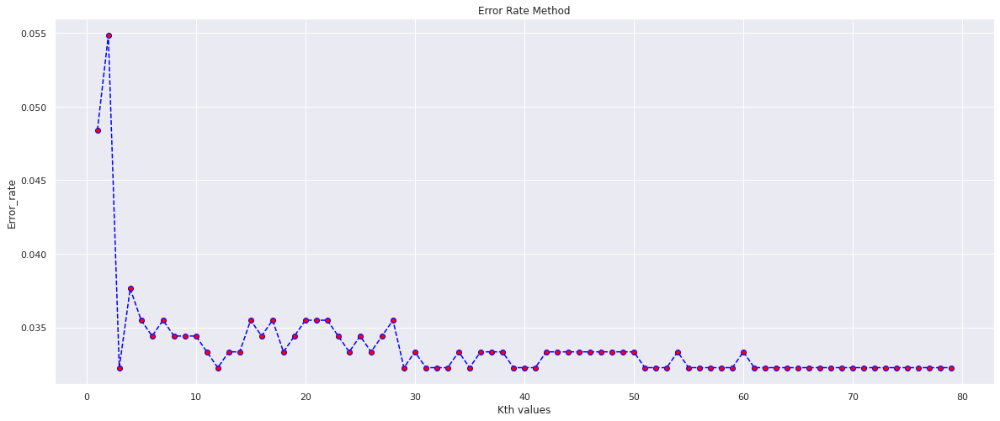

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(range(1,80),error_rate,color='blue',linestyle='dashed',marker='o',markerfacecolor='red')
plt.title("Error Rate Method")
plt.xlabel('Kth values')
plt.ylabel('Error_rate')

In [ ]:
model_er=KNeighborsClassifier(n_neighbors=9,p=2,metric='euclidean') 
model_er.fit(X_train,y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=9)

In [ ]:
y_pred_er = model_er.predict(X_test)

In [ ]:
acc_knn=accuracy_score(y_test,y_pred_er)
acc_knn

0.9655913978494624

#KNN confusion matrix

In [ ]:
confusion_matrix(y_test,y_pred_er)

array([[287,  22],
       [ 10, 611]])

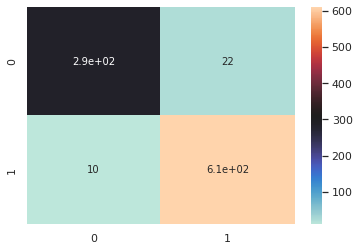

In [ ]:
sns.heatmap(confusion_matrix(y_test,y_pred_er),cmap='icefire',annot=True);

#SVM Confusion matrix

In [ ]:

confusion_matrix(y_test,y_pred_svm)

array([[285,  24],
       [  5, 616]])

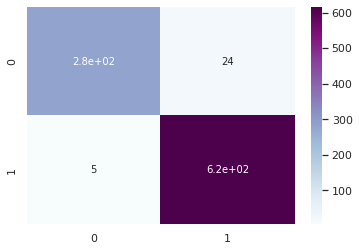

In [ ]:
sns.heatmap(confusion_matrix(y_test,y_pred_svm),cmap='BuPu',annot=True);

#NB

In [ ]:
confusion_matrix(y_test,y_pred)

array([[283,  26],
       [  4, 617]])

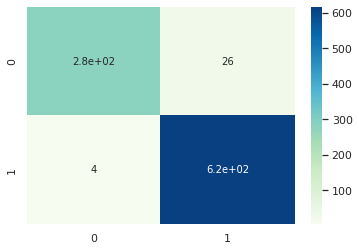

In [ ]:
sns.heatmap(confusion_matrix(y_test,y_pred),cmap='GnBu',annot=True);

#Classification report

In [ ]:
class_report_knn = classification_report(y_test,y_pred_er)
print(class_report_knn)
class_report_svm = classification_report(y_test,y_pred_svm)
print(class_report_svm)
class_report_NB = classification_report(y_test,y_pred)
print(class_report_NB)


              precision    recall  f1-score   support

           0       0.97      0.93      0.95       309
           1       0.97      0.98      0.97       621

    accuracy                           0.97       930
   macro avg       0.97      0.96      0.96       930
weighted avg       0.97      0.97      0.97       930

              precision    recall  f1-score   support

           0       0.98      0.92      0.95       309
           1       0.96      0.99      0.98       621

    accuracy                           0.97       930
   macro avg       0.97      0.96      0.96       930
weighted avg       0.97      0.97      0.97       930

              precision    recall  f1-score   support

           0       0.99      0.92      0.95       309
           1       0.96      0.99      0.98       621

    accuracy                           0.97       930
   macro avg       0.97      0.95      0.96       930
weighted avg       0.97      0.97      0.97       930



#**F1score** 

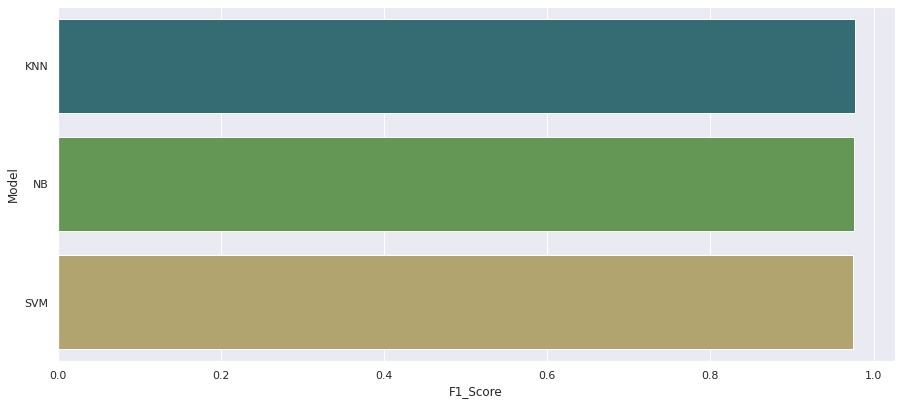

In [ ]:
#F1 score
from sklearn.metrics import f1_score
svm_lin_f1=f1_score(y_pred_svm,y_test)
knn_f1=f1_score(y_test,y_pred_er)
Nb_f1=f1_score(y_test,y_pred)
compare = pd.DataFrame({"Model": ["KNN","SVM","NB"],
                        
                        "F1_Score": [svm_lin_f1,knn_f1,Nb_f1]})
plt.figure(figsize=(15,30))
plt.subplot(411)
compare = compare.sort_values(by="F1_Score", ascending=False)
ax=sns.barplot(x="F1_Score", y="Model", data=compare, palette="gist_earth")

#**Recall**

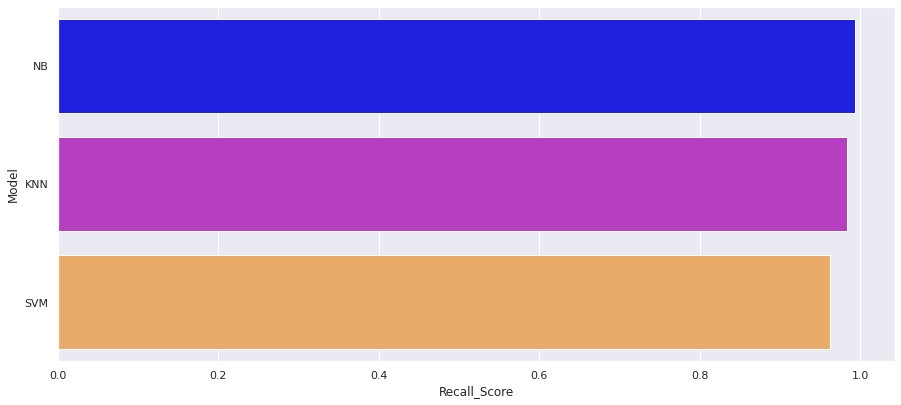

In [ ]:
#Recall
from sklearn.metrics import recall_score
svm_lin_Re=recall_score(y_pred_svm,y_test)
knn_RE=recall_score(y_test,y_pred_er)
Nb_Re=recall_score(y_test,y_pred)
compare = pd.DataFrame({"Model": ["SVM","KNN","NB"],
                        
                        "Recall_Score": [svm_lin_Re,knn_RE,Nb_Re]})
plt.figure(figsize=(15,30))
plt.subplot(411)
compare = compare.sort_values(by="Recall_Score", ascending=False)
ax=sns.barplot(x="Recall_Score", y="Model", data=compare, palette="gnuplot2")

#**Precision**

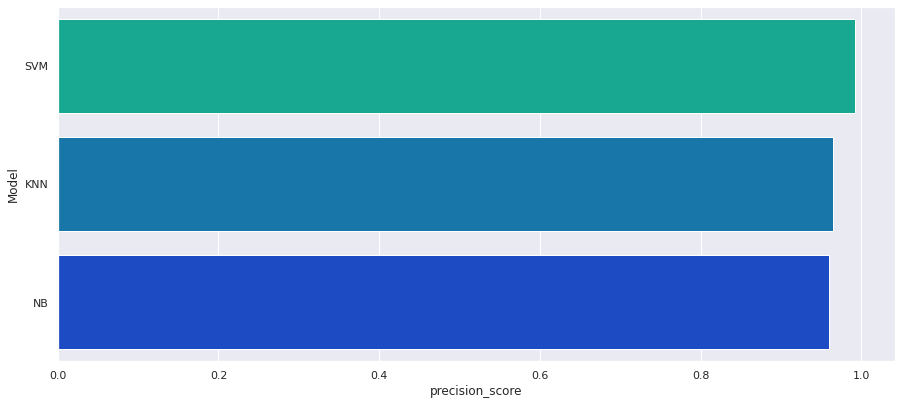

In [ ]:
#Precision
from sklearn.metrics import precision_score
svm_lin_p=precision_score(y_pred_svm,y_test)
knn_p=precision_score(y_test,y_pred_er)
Nb_p=precision_score(y_test,y_pred)
compare = pd.DataFrame({"Model": ["SVM","KNN","NB"],
                        
                        "precision_score": [svm_lin_p,knn_p,Nb_p]})
plt.figure(figsize=(15,30))
plt.subplot(411)
compare = compare.sort_values(by="precision_score", ascending=False)
ax=sns.barplot(x="precision_score", y="Model", data=compare, palette="winter_r")

#**Accuracy_Score**

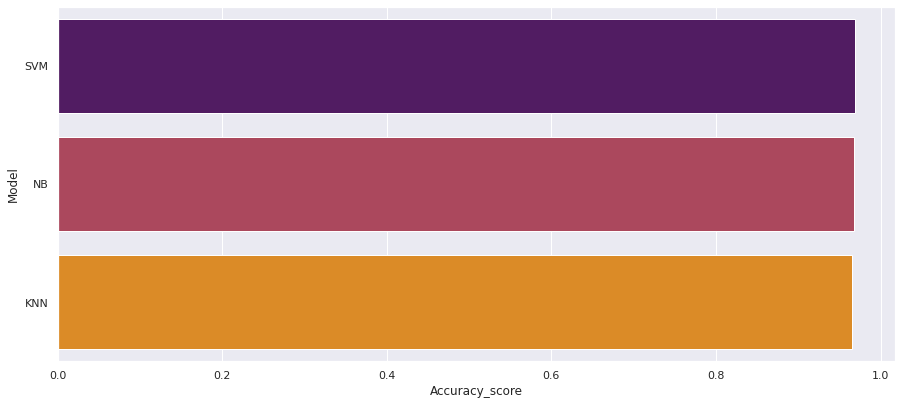

In [ ]:
#Accuracy Score
from sklearn.metrics import accuracy_score
svm_lin=accuracy_score(y_pred_svm,y_test)
knn=accuracy_score(y_test,y_pred_er)
Nb=accuracy_score(y_test,y_pred)
compare = pd.DataFrame({"Model": ["SVM","KNN","NB"],
                        
                        "Accuracy_score": [svm_lin,knn,Nb]})
plt.figure(figsize=(15,30))
plt.subplot(411)
compare = compare.sort_values(by="Accuracy_score", ascending=False)
ax=sns.barplot(x="Accuracy_score", y="Model", data=compare, palette="inferno")